t‑SNE: нелинейное вложение, оптимизирует дивергенцию Кульбака–Лейблера между распределениями близостей точек, хорошо показывает локальные кластеры, но медленно, плохо сохраняет глобальные расстояния, чувствительно к perplexity и random_state.

UMAP: основан на теории многобразий и топологии, строит взвешенный граф соседей и оптимизирует кросс‑энтропию; быстрее t‑SNE, лучше сохраняет глобальную структуру, более устойчив к малым изменениям параметров (n_neighbors, min_dist).

TriMAP: ориентирован на сохранение глобальной структуры через тройки точек (anchor, сосед, далёкий), улучшает глобальное расположение кластеров при сохранении локальной структуры.

PaCMAP: управляет соотношением близких, средних и далёких пар, чтобы одновременно хорошо держать локальные кластеры и общую форму; показывает хорошие результаты на омикс‑данных и эмбеддингах.

PHATE: использует диффузионные процессы и потенциал для визуализации непрерывных траекторий (например, дифференцировка клеток), хорошо показывает как кластеры, так и переходы между ними.



In [ ]:
%pip install umap-learn trimap pacmap phate scikit-learn seaborn

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

from sklearn.datasets import load_iris
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import pairwise_distances

from sklearn.manifold import TSNE
import umap
import trimap
import pacmap
import phate

c:\Users\Elisey\AppData\Local\Python\pythoncore-3.14-64\Lib\site-packages\tqdm\auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [2]:
iris = load_iris()
X_iris = iris.data
y_iris = iris.target
feature_names_iris = iris.feature_names
print(X_iris.shape, np.unique(y_iris))

(150, 4) [0 1 2]


In [3]:
path = "data/EEG-Eye-State.csv"  # замените на свой путь
df = pd.read_csv(path)
df.head()

,AF3,AF4,F3,F4,F7,F8,FC5,FC6,T7,T8,P7,P8,O1,O2,eyeDetection
0,4329.23,4393.85,4289.23,4280.51,4009.23,4635.90,4148.21,4211.28,4350.26,4238.46,4586.15,4222.05,4096.92,4641.03,0
1,4324.62,4384.10,4293.85,4279.49,4004.62,4632.82,4148.72,4207.69,4342.05,4226.67,4586.67,4210.77,4097.44,4638.97,0
2,4327.69,4389.23,4295.38,4282.05,4006.67,4628.72,4156.41,4206.67,4336.92,4222.05,4583.59,4207.69,4096.92,4630.26,0
3,4328.72,4396.41,4296.41,4287.69,4011.79,4632.31,4155.90,4210.77,4343.59,4235.38,4582.56,4217.44,4097.44,4630.77,0
4,4326.15,4398.46,4292.31,4288.21,4011.79,4632.82,4151.28,4212.82,4347.69,4244.10,4586.67,4210.77,4095.90,4627.69,0


## Убираем выбросы в данных

In [4]:
q = 0.999

feature_names = [x for x in df.columns if x != 'eyeDetection']
for feature in feature_names:
    df = df[df[feature] < df[feature].quantile(q)]
df

,AF3,AF4,F3,F4,F7,F8,FC5,FC6,T7,T8,P7,P8,O1,O2,eyeDetection
0,4329.23,4393.85,4289.23,4280.51,4009.23,4635.90,4148.21,4211.28,4350.26,4238.46,4586.15,4222.05,4096.92,4641.03,0
1,4324.62,4384.10,4293.85,4279.49,4004.62,4632.82,4148.72,4207.69,4342.05,4226.67,4586.67,4210.77,4097.44,4638.97,0
2,4327.69,4389.23,4295.38,4282.05,4006.67,4628.72,4156.41,4206.67,4336.92,4222.05,4583.59,4207.69,4096.92,4630.26,0
3,4328.72,4396.41,4296.41,4287.69,4011.79,4632.31,4155.90,4210.77,4343.59,4235.38,4582.56,4217.44,4097.44,4630.77,0
4,4326.15,4398.46,4292.31,4288.21,4011.79,4632.82,4151.28,4212.82,4347.69,4244.10,4586.67,4210.77,4095.90,4627.69,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
14975,4281.03,4340.51,4245.64,4269.23,3990.26,4593.33,4116.92,4171.28,4333.85,4221.54,4614.36,4203.08,4074.87,4625.64,1
14976,4276.92,4333.33,4245.13,4259.49,3991.79,4590.26,4110.77,4162.56,4332.82,4217.44,4615.38,4194.36,4073.33,4621.54,1
14977,4277.44,4339.49,4246.67,4257.95,3990.77,4591.79,4113.85,4160.51,4333.33,4212.82,4615.38,4193.33,4072.82,4623.59,1
14978,4284.62,4350.77,4251.28,4267.18,3991.79,4596.41,4122.05,4165.64,4334.36,4220.00,4616.41,4200.00,4080.51,4628.72,1


In [5]:
feature_cols = [c for c in df.columns if c != "eyeDetection"]
X_own = df[feature_cols].values
y_own = df["eyeDetection"].values
print(X_own.shape, len(np.unique(y_own)))

(14760, 14) 2


In [14]:
target_class_names_dict = {
    0: 'Closed',
    1: 'Open Eyes'
}
target_class_names_dict

{0: 'Closed', 1: 'Open Eyes'}

In [26]:
y_own_labels = np.array([target_class_names_dict[y_] for y_ in y_own])
y_own_labels

array(['Closed', 'Closed', 'Closed', ..., 'Open Eyes', 'Open Eyes',
       'Open Eyes'], shape=(14760,), dtype='<U9')

In [17]:
scaler_iris = StandardScaler()
X_iris_scaled = scaler_iris.fit_transform(X_iris)

scaler_own = StandardScaler()
X_own_scaled = scaler_own.fit_transform(X_own)

Функции для DR и оценки разделения

In [18]:
def run_tsne(X, random_state=42, perplexity=30, learning_rate=200, n_iter=1000):
    tsne = TSNE(
        random_state=random_state,
        perplexity=perplexity,
        learning_rate=learning_rate,
        #n_iter=n_iter
    )
    return tsne.fit_transform(X)

def run_umap(X, random_state=42, n_neighbors=15, min_dist=0.1):
    Umap = umap.UMAP(
        random_state=random_state,
        n_neighbors=n_neighbors,
        min_dist=min_dist
    )
    return Umap.fit_transform(X)

def run_trimap(X, n_inliers=10, n_outliers=5):
    Trimap = trimap.TRIMAP(
        n_inliers=n_inliers,
        n_outliers=n_outliers
    )
    return Trimap.fit_transform(X)

def run_pacmap(X, random_state=42, n_neighbors=10):
    Pacmap = pacmap.PaCMAP(
        random_state=random_state,
        n_neighbors=n_neighbors
    )
    return Pacmap.fit_transform(X)

def run_phate(X, random_state=42, knn=15):
    phate_op = phate.PHATE(
        random_state=random_state,
        knn=knn
    )
    return phate_op.fit_transform(X)


Функция оценки качества разделения

In [19]:
def separation_score(X_2d, y):
    D = pairwise_distances(X_2d)
    same = D[y[:, None] == y[None, :]]
    diff = D[y[:, None] != y[None, :]]
    return same.mean(), diff.mean(), diff.mean() / same.mean()


In [20]:
# Отрисовка

def plot_embedding(X_2d, y, title):
    plt.figure(figsize=(6, 5))
    sns.scatterplot(
        x=X_2d[:, 0],
        y=X_2d[:, 1],
        hue=y,
        palette="tab10",
        s=30,
        legend="full"
    )
    plt.title(title)
    plt.xticks([])
    plt.yticks([])
    plt.legend(title="Класс", bbox_to_anchor=(1.05, 1), loc="upper left")
    plt.tight_layout()
    plt.show()

## IRIS

c:\Users\Elisey\AppData\Local\Python\pythoncore-3.14-64\Lib\site-packages\umap\umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


Calculating PHATE...
  Running PHATE on 150 observations and 4 variables.
  Calculating graph and diffusion operator...
    Calculating KNN search...
    Calculating affinities...
  Calculating optimal t...
    Automatically selected t = 22
  Calculated optimal t in 0.02 seconds.
  Calculating diffusion potential...
  Calculating metric MDS...


c:\Users\Elisey\AppData\Local\Python\pythoncore-3.14-64\Lib\site-packages\graphtools\graphs.py:803: RuntimeWarning: Detected zero distance between samples 101 and 142. Consider removing duplicates to avoid errors in downstream processing.
  warnings.warn(


    SGD-MDS may not have converged: stress changed by -1.4% in final iterations. Consider increasing n_iter or adjusting learning_rate.
  Calculated metric MDS in 0.11 seconds.
Calculated PHATE in 0.14 seconds.


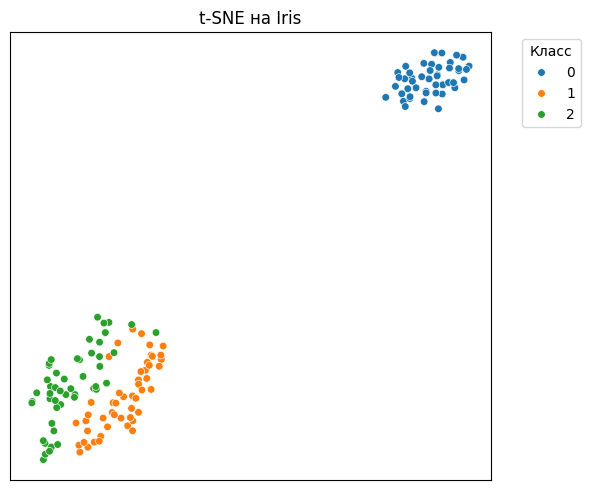

t-SNE: внутрикласс.=3.580, межкласс.=28.091, ratio=7.846


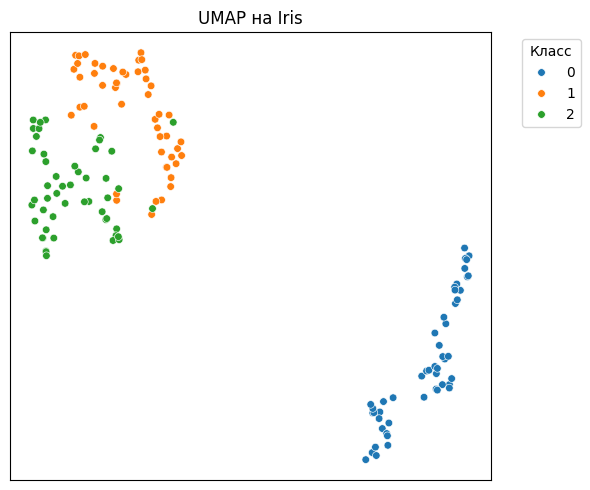

UMAP: внутрикласс.=1.902, межкласс.=10.504, ratio=5.524


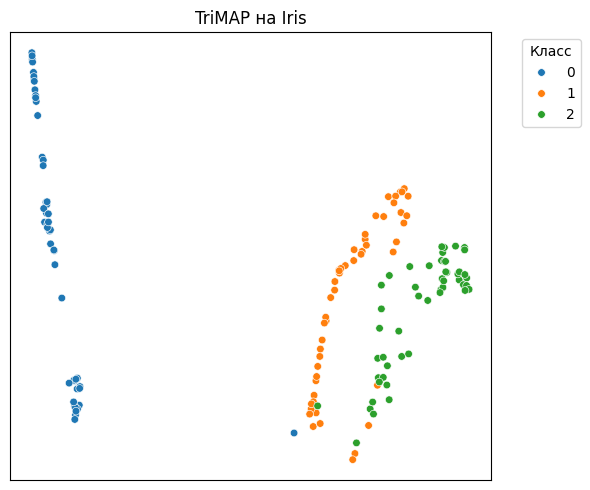

TriMAP: внутрикласс.=11.287, межкласс.=60.423, ratio=5.353


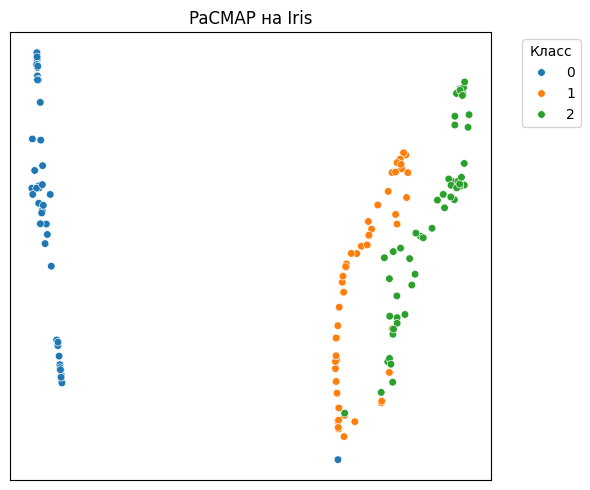

PaCMAP: внутрикласс.=3.471, межкласс.=17.697, ratio=5.099


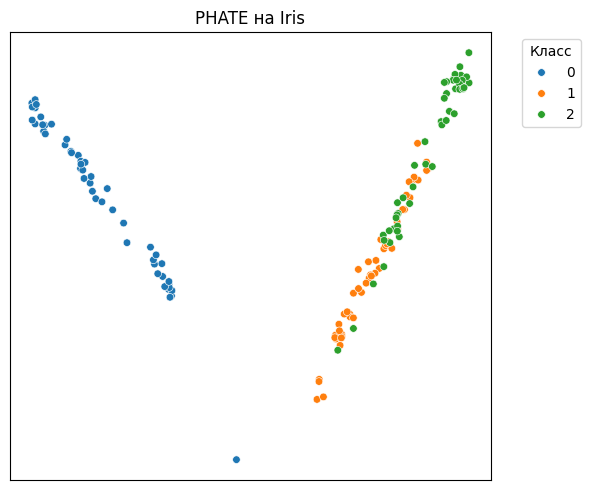

PHATE: внутрикласс.=0.026, межкласс.=0.121, ratio=4.610


In [21]:
X_list = []
names = []

X_tsne_iris = run_tsne(X_iris_scaled, random_state=42)
X_list.append(X_tsne_iris); names.append("t-SNE")

X_umap_iris = run_umap(X_iris_scaled, random_state=42)
X_list.append(X_umap_iris); names.append("UMAP")

X_trimap_iris = run_trimap(X_iris_scaled)
X_list.append(X_trimap_iris); names.append("TriMAP")

X_pacmap_iris = run_pacmap(X_iris_scaled, random_state=42)
X_list.append(X_pacmap_iris); names.append("PaCMAP")

X_phate_iris = run_phate(X_iris_scaled, random_state=42)
X_list.append(X_phate_iris); names.append("PHATE")


for X_emb, name in zip(X_list, names):
    plot_embedding(X_emb, y_iris, f"{name} на Iris")
    same, diff, ratio = separation_score(X_emb, y_iris)
    print(
        f"{name}: внутрикласс.={same:.3f}, межкласс.={diff:.3f}, ratio={ratio:.3f}"
    )


# Мой датасет

c:\Users\Elisey\AppData\Local\Python\pythoncore-3.14-64\Lib\site-packages\umap\umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


Calculating PHATE...
  Running PHATE on 14760 observations and 14 variables.
  Calculating graph and diffusion operator...
    Calculating KNN search...
    Calculated KNN search in 1.69 seconds.
    Calculating affinities...
    Calculated affinities in 0.21 seconds.
  Calculated graph and diffusion operator in 1.93 seconds.
  Calculating landmark operator...
    Calculating SVD...
    Calculated SVD in 1.04 seconds.
    Calculating KMeans...
    Calculated KMeans in 1.83 seconds.
  Calculated landmark operator in 2.87 seconds.
  Calculating optimal t...
    Automatically selected t = 42
  Calculated optimal t in 1.56 seconds.
  Calculating diffusion potential...
  Calculated diffusion potential in 0.45 seconds.
  Calculating metric MDS...
  Calculated metric MDS in 1.76 seconds.
Calculated PHATE in 8.98 seconds.


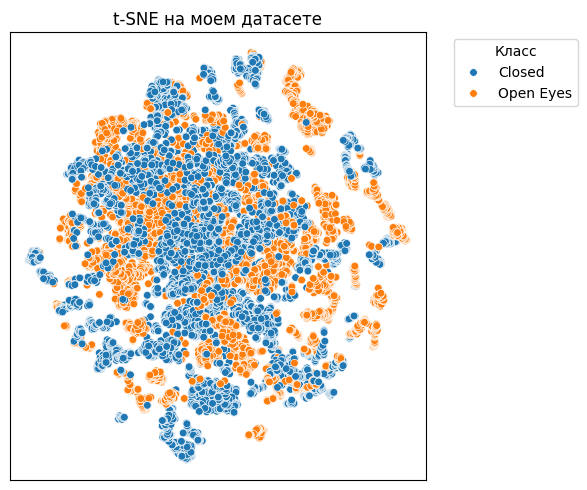

t-SNE: внутрикласс.=75.901, межкласс.=77.310, ratio=1.019


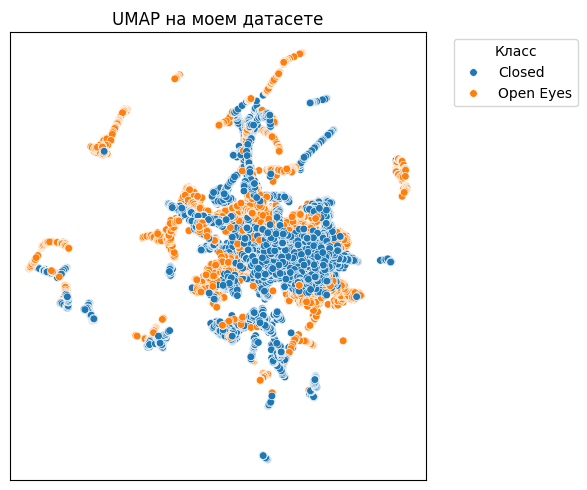

UMAP: внутрикласс.=7.501, межкласс.=7.865, ratio=1.049


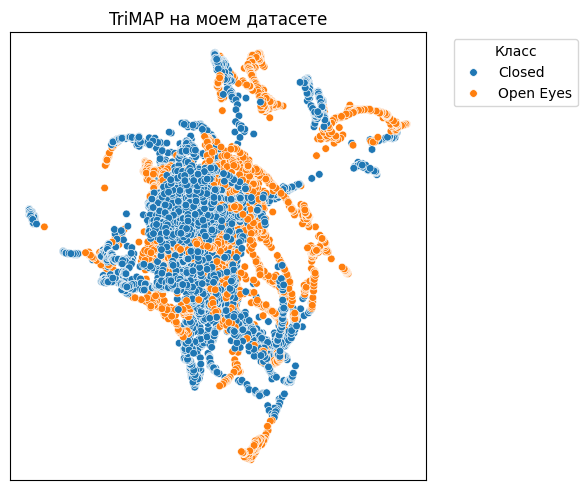

TriMAP: внутрикласс.=54.465, межкласс.=56.169, ratio=1.031


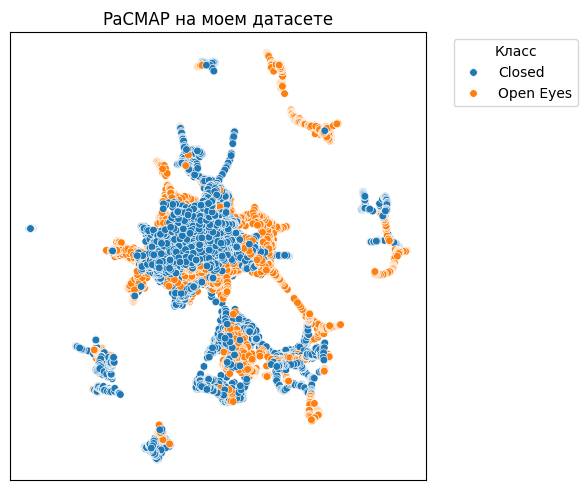

PaCMAP: внутрикласс.=15.258, межкласс.=15.726, ratio=1.031


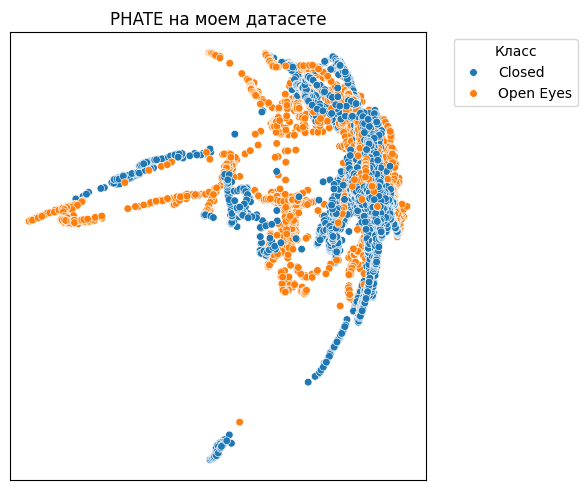

PHATE: внутрикласс.=0.019, межкласс.=0.020, ratio=1.045


In [27]:
X_list = []
names = []

X_tsne_iris = run_tsne(X_own_scaled, random_state=42)
X_list.append(X_tsne_iris); names.append("t-SNE")

X_umap_iris = run_umap(X_own_scaled, random_state=42)
X_list.append(X_umap_iris); names.append("UMAP")

X_trimap_iris = run_trimap(X_own_scaled)
X_list.append(X_trimap_iris); names.append("TriMAP")

X_pacmap_iris = run_pacmap(X_own_scaled, random_state=42)
X_list.append(X_pacmap_iris); names.append("PaCMAP")

X_phate_iris = run_phate(X_own_scaled, random_state=42)
X_list.append(X_phate_iris); names.append("PHATE")

for X_emb, name in zip(X_list, names):
    plot_embedding(X_emb, y_own_labels, f"{name} на моем датасете")
    same, diff, ratio = separation_score(X_emb, y_own_labels)
    print(
        f"{name}: внутрикласс.={same:.3f}, межкласс.={diff:.3f}, ratio={ratio:.3f}"
    )

Сравнение устойчивости

# t-SNE

## IRIS

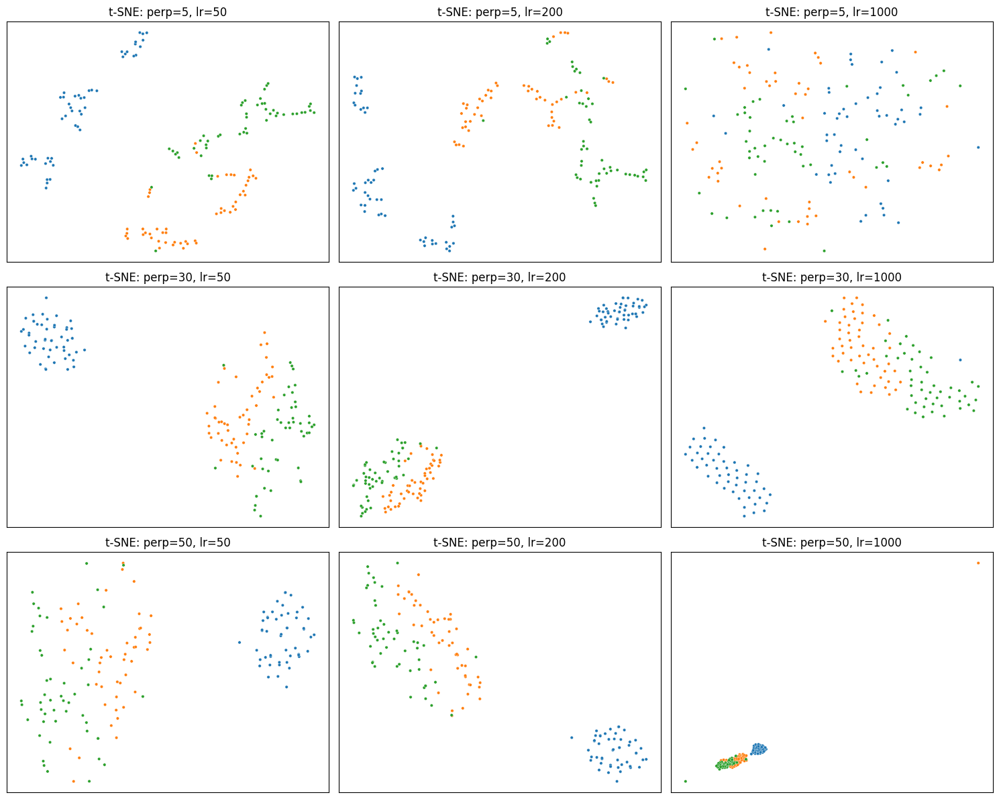

In [28]:
perplexities = [5, 30, 50]
lrs = [50, 200, 1000]

fig, axes = plt.subplots(len(perplexities), len(lrs), figsize=(5*len(lrs), 4*len(perplexities)))

for i, perp in enumerate(perplexities):
    for j, lr in enumerate(lrs):
        X_emb = run_tsne(X_iris_scaled, random_state=42, perplexity=perp, learning_rate=lr)
        ax = axes[i, j]
        sns.scatterplot(x=X_emb[:, 0], y=X_emb[:, 1], hue=y_iris, palette="tab10", s=10, ax=ax, legend=False)
        ax.set_title(f"t-SNE: perp={perp}, lr={lr}")
        ax.set_xticks([]); ax.set_yticks([])

plt.tight_layout()
plt.show()


# Мой датасет

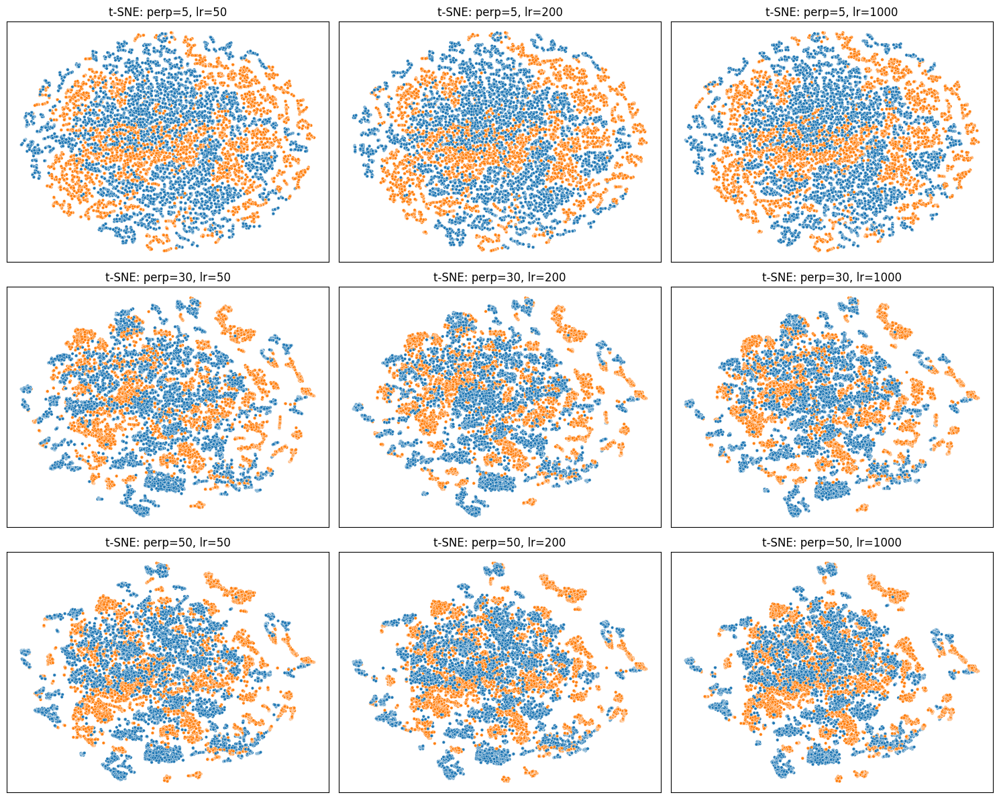

In [29]:
perplexities = [5, 30, 50]
lrs = [50, 200, 1000]

fig, axes = plt.subplots(len(perplexities), len(lrs), figsize=(5*len(lrs), 4*len(perplexities)))

for i, perp in enumerate(perplexities):
    for j, lr in enumerate(lrs):
        X_emb = run_tsne(X_own_scaled, random_state=42, perplexity=perp, learning_rate=lr)
        ax = axes[i, j]
        sns.scatterplot(x=X_emb[:, 0], y=X_emb[:, 1], hue=y_own_labels, palette="tab10", s=10, ax=ax, legend=False)
        ax.set_title(f"t-SNE: perp={perp}, lr={lr}")
        ax.set_xticks([]); ax.set_yticks([])

plt.tight_layout()
plt.show()

Нужно описать, как меняется форма и расположение кластеров при разных perplexity и learning_rate и что визуализация t‑SNE может сильно меняться.

# UMAP

## IRIS

c:\Users\Elisey\AppData\Local\Python\pythoncore-3.14-64\Lib\site-packages\umap\umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(
c:\Users\Elisey\AppData\Local\Python\pythoncore-3.14-64\Lib\site-packages\umap\umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(
c:\Users\Elisey\AppData\Local\Python\pythoncore-3.14-64\Lib\site-packages\umap\umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(
c:\Users\Elisey\AppData\Local\Python\pythoncore-3.14-64\Lib\site-packages\umap\umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(
c:\Users\Elisey\AppData\Local\Python\pythoncore-3.14-64\Lib\site-packages\umap\umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


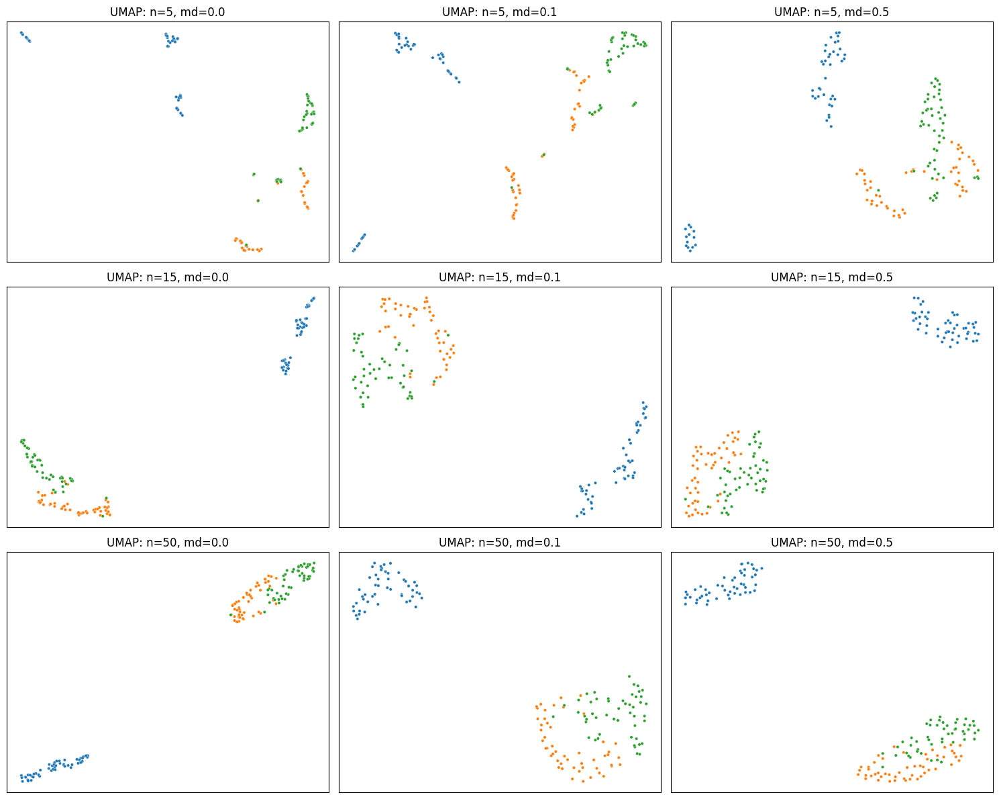

In [34]:
n_neighbors_list = [5, 15, 50]
min_dist_list = [0.0, 0.1, 0.5]

fig, axes = plt.subplots(len(n_neighbors_list), len(min_dist_list), figsize=(5*len(min_dist_list), 4*len(n_neighbors_list)))

for i, n_neighbors in enumerate(n_neighbors_list):
    for j, min_dist in enumerate(min_dist_list):
        X_emb = run_umap(X_iris_scaled, random_state=42, n_neighbors=n_neighbors, min_dist=min_dist)
        ax = axes[i, j]
        sns.scatterplot(x=X_emb[:, 0], y=X_emb[:, 1], hue=y_iris, palette="tab10", s=10, ax=ax, legend=False)
        ax.set_title(f"UMAP: n={n_neighbors}, md={min_dist}")
        ax.set_xticks([]); ax.set_yticks([])

plt.tight_layout()
plt.show()

## Мой датасет

c:\Users\Elisey\AppData\Local\Python\pythoncore-3.14-64\Lib\site-packages\umap\umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(
c:\Users\Elisey\AppData\Local\Python\pythoncore-3.14-64\Lib\site-packages\umap\umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(
c:\Users\Elisey\AppData\Local\Python\pythoncore-3.14-64\Lib\site-packages\umap\umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(
c:\Users\Elisey\AppData\Local\Python\pythoncore-3.14-64\Lib\site-packages\umap\umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(
c:\Users\Elisey\AppData\Local\Python\pythoncore-3.14-64\Lib\site-packages\umap\umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


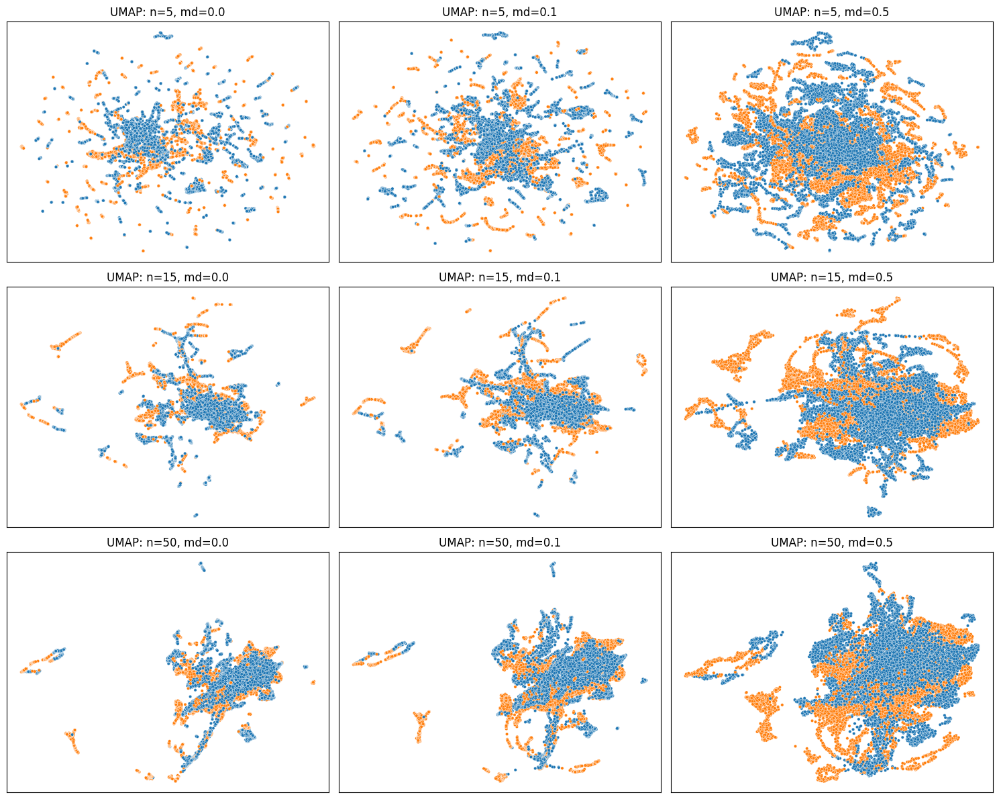

In [35]:
n_neighbors_list = [5, 15, 50]
min_dist_list = [0.0, 0.1, 0.5]

fig, axes = plt.subplots(len(n_neighbors_list), len(min_dist_list), figsize=(5*len(min_dist_list), 4*len(n_neighbors_list)))

for i, n_neighbors in enumerate(n_neighbors_list):
    for j, min_dist in enumerate(min_dist_list):
        X_emb = run_umap(X_own_scaled, random_state=42, n_neighbors=n_neighbors, min_dist=min_dist)
        ax = axes[i, j]
        sns.scatterplot(x=X_emb[:, 0], y=X_emb[:, 1], hue=y_own_labels, palette="tab10", s=10, ax=ax, legend=False)
        ax.set_title(f"UMAP: n={n_neighbors}, md={min_dist}")
        ax.set_xticks([]); ax.set_yticks([])

plt.tight_layout()
plt.show()

# TRIMAP

## IRIS

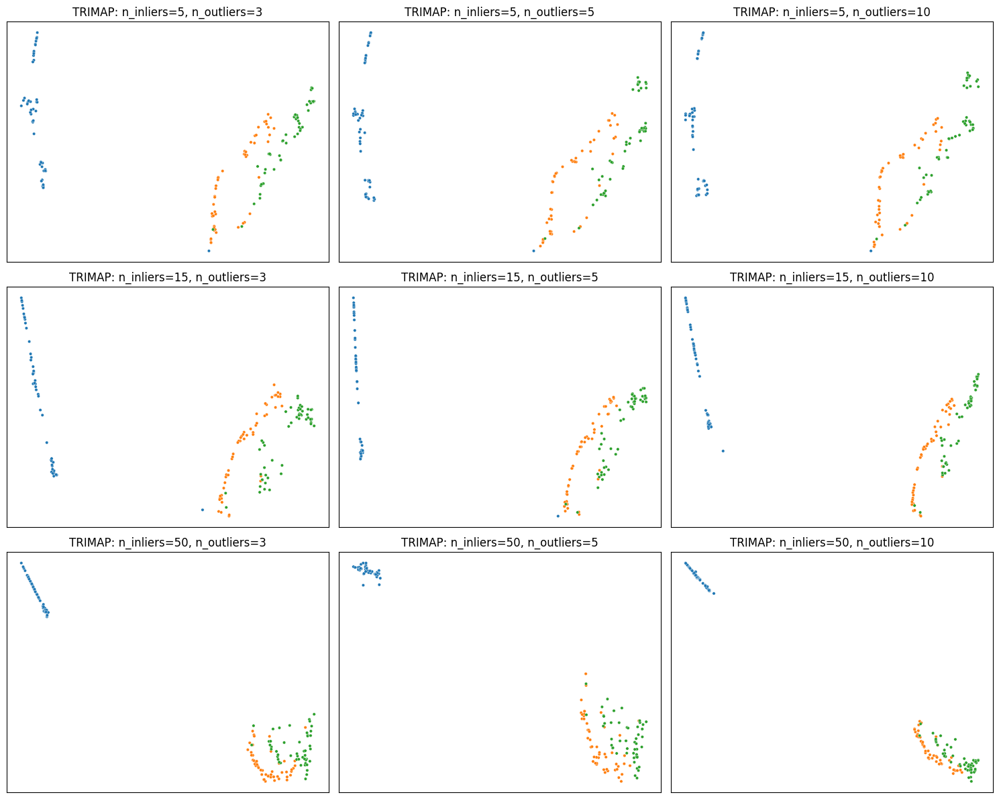

In [37]:
n_inliers_list = [5, 15, 50]
n_outliers_list = [3, 5, 10]

fig, axes = plt.subplots(len(n_inliers_list), len(n_outliers_list), figsize=(5*len(n_outliers_list), 4*len(n_inliers_list)))

for i, n_inliers in enumerate(n_inliers_list):
    for j, n_outliers in enumerate(n_outliers_list):
        X_emb = run_trimap(X_iris_scaled, n_inliers=n_inliers, n_outliers=n_outliers)
        ax = axes[i, j]
        sns.scatterplot(x=X_emb[:, 0], y=X_emb[:, 1], hue=y_iris, palette="tab10", s=10, ax=ax, legend=False)
        ax.set_title(f"TRIMAP: n_inliers={n_inliers}, n_outliers={n_outliers}")
        ax.set_xticks([]); ax.set_yticks([])

plt.tight_layout()
plt.show()

## Мой датасет

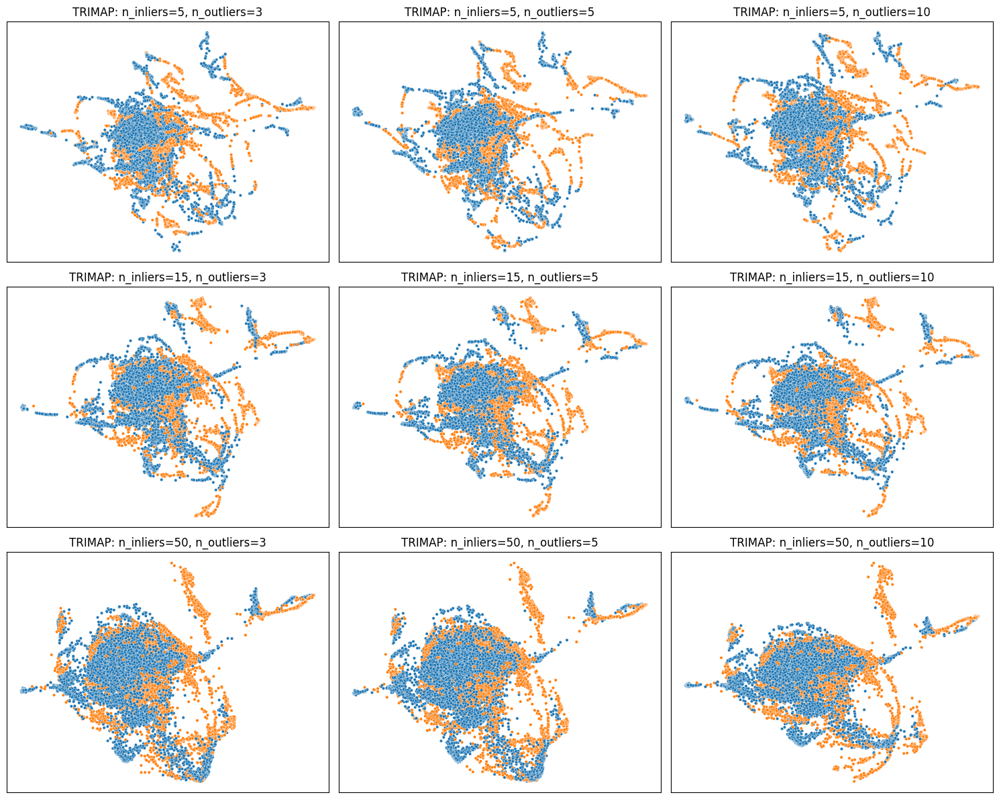

In [38]:
n_inliers_list = [5, 15, 50]
n_outliers_list = [3, 5, 10]

fig, axes = plt.subplots(len(n_inliers_list), len(n_outliers_list), figsize=(5*len(n_outliers_list), 4*len(n_inliers_list)))

for i, n_inliers in enumerate(n_inliers_list):
    for j, n_outliers in enumerate(n_outliers_list):
        X_emb = run_trimap(X_own_scaled, n_inliers=n_inliers, n_outliers=n_outliers)
        ax = axes[i, j]
        sns.scatterplot(x=X_emb[:, 0], y=X_emb[:, 1], hue=y_own_labels, palette="tab10", s=10, ax=ax, legend=False)
        ax.set_title(f"TRIMAP: n_inliers={n_inliers}, n_outliers={n_outliers}")
        ax.set_xticks([]); ax.set_yticks([])

plt.tight_layout()
plt.show()

# PaCMAP

## IRIS

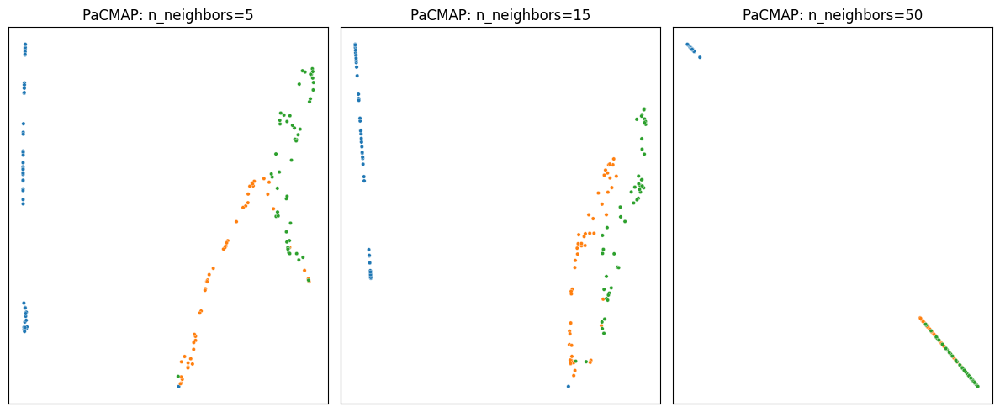

In [42]:
n_neighbors_list = [5, 15, 50]

fig, axes = plt.subplots(1, len(n_neighbors_list), figsize=(4*len(n_neighbors_list), 5))

for i, n_neighbors in enumerate(n_neighbors_list):
    X_emb = run_pacmap(X_iris_scaled, random_state=42, n_neighbors=n_neighbors)
    ax = axes[i]
    sns.scatterplot(x=X_emb[:, 0], y=X_emb[:, 1], hue=y_iris, palette="tab10", s=10, ax=ax, legend=False)
    ax.set_title(f"PaCMAP: n_neighbors={n_neighbors}")
    ax.set_xticks([]); ax.set_yticks([])

plt.tight_layout()
plt.show()

## Мой датасет

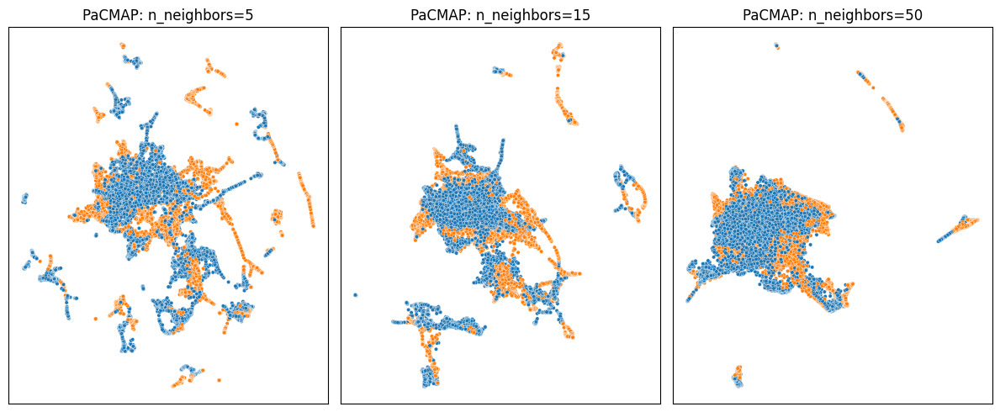

In [43]:
n_neighbors_list = [5, 15, 50]

fig, axes = plt.subplots(1, len(n_neighbors_list), figsize=(4*len(n_neighbors_list), 5))

for i, n_neighbors in enumerate(n_neighbors_list):
    X_emb = run_pacmap(X_own_scaled, random_state=42, n_neighbors=n_neighbors)
    ax = axes[i]
    sns.scatterplot(x=X_emb[:, 0], y=X_emb[:, 1], hue=y_own_labels, palette="tab10", s=10, ax=ax, legend=False)
    ax.set_title(f"PaCMAP: n_neighbors={n_neighbors}")
    ax.set_xticks([]); ax.set_yticks([])

plt.tight_layout()
plt.show()

# PHATE

## IRIS

Calculating PHATE...
  Running PHATE on 150 observations and 4 variables.
  Calculating graph and diffusion operator...
    Calculating KNN search...
    Calculating affinities...
  Calculating optimal t...
    Automatically selected t = 21
  Calculated optimal t in 0.01 seconds.
  Calculating diffusion potential...
  Calculating metric MDS...
    SGD-MDS may not have converged: stress changed by 1.4% in final iterations. Consider increasing n_iter or adjusting learning_rate.
  Calculated metric MDS in 0.09 seconds.
Calculated PHATE in 0.12 seconds.
Calculating PHATE...
  Running PHATE on 150 observations and 4 variables.
  Calculating graph and diffusion operator...
    Calculating KNN search...
    Calculating affinities...
  Calculating optimal t...
    Automatically selected t = 22
  Calculated optimal t in 0.01 seconds.
  Calculating diffusion potential...
  Calculating metric MDS...


c:\Users\Elisey\AppData\Local\Python\pythoncore-3.14-64\Lib\site-packages\graphtools\graphs.py:803: RuntimeWarning: Detected zero distance between samples 101 and 142. Consider removing duplicates to avoid errors in downstream processing.
  warnings.warn(
c:\Users\Elisey\AppData\Local\Python\pythoncore-3.14-64\Lib\site-packages\graphtools\graphs.py:803: RuntimeWarning: Detected zero distance between samples 101 and 142. Consider removing duplicates to avoid errors in downstream processing.
  warnings.warn(


    SGD-MDS may not have converged: stress changed by -1.4% in final iterations. Consider increasing n_iter or adjusting learning_rate.
  Calculated metric MDS in 0.10 seconds.
Calculated PHATE in 0.13 seconds.
Calculating PHATE...
  Running PHATE on 150 observations and 4 variables.
  Calculating graph and diffusion operator...
    Calculating KNN search...
    Calculating affinities...
  Calculating optimal t...
    Automatically selected t = 4
  Calculated optimal t in 0.01 seconds.
  Calculating diffusion potential...
  Calculating metric MDS...
    SGD-MDS may not have converged: stress changed by -2.4% in final iterations. Consider increasing n_iter or adjusting learning_rate.
  Calculated metric MDS in 0.09 seconds.
Calculated PHATE in 0.12 seconds.


c:\Users\Elisey\AppData\Local\Python\pythoncore-3.14-64\Lib\site-packages\graphtools\graphs.py:803: RuntimeWarning: Detected zero distance between samples 101 and 142. Consider removing duplicates to avoid errors in downstream processing.
  warnings.warn(


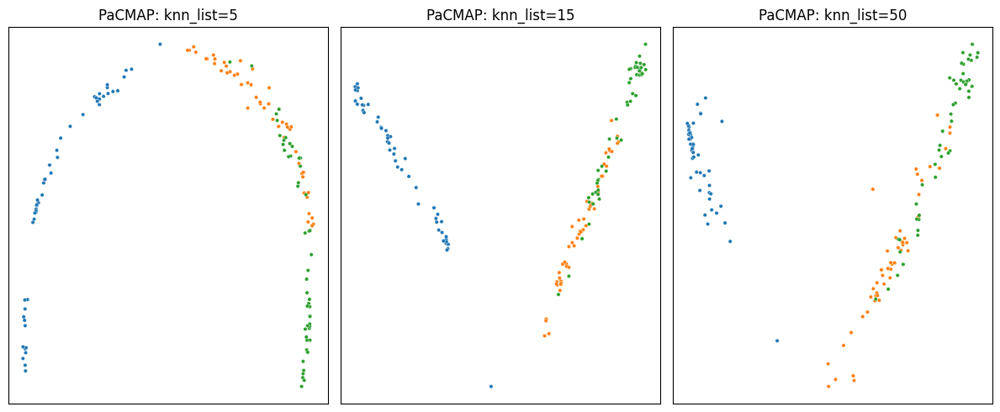

In [44]:
knn_list = [5, 15, 50]

fig, axes = plt.subplots(1, len(knn_list), figsize=(4*len(knn_list), 5))

for i, knn in enumerate(knn_list):
    X_emb = run_phate(X_iris_scaled, random_state=42, knn=knn)
    ax = axes[i]
    sns.scatterplot(x=X_emb[:, 0], y=X_emb[:, 1], hue=y_iris, palette="tab10", s=10, ax=ax, legend=False)
    ax.set_title(f"PaCMAP: knn_list={knn}")
    ax.set_xticks([]); ax.set_yticks([])

plt.tight_layout()
plt.show()

## Мой датасет

Calculating PHATE...
  Running PHATE on 14760 observations and 14 variables.
  Calculating graph and diffusion operator...
    Calculating KNN search...
    Calculated KNN search in 1.32 seconds.
    Calculating affinities...
    Calculated affinities in 0.19 seconds.
  Calculated graph and diffusion operator in 1.53 seconds.
  Calculating landmark operator...
    Calculating SVD...
    Calculated SVD in 0.78 seconds.
    Calculating KMeans...
    Calculated KMeans in 3.43 seconds.
  Calculated landmark operator in 4.21 seconds.
  Calculating optimal t...
    Automatically selected t = 43
  Calculated optimal t in 4.93 seconds.
  Calculating diffusion potential...
  Calculated diffusion potential in 1.76 seconds.
  Calculating metric MDS...
  Calculated metric MDS in 3.46 seconds.
Calculated PHATE in 16.69 seconds.
Calculating PHATE...
  Running PHATE on 14760 observations and 14 variables.
  Calculating graph and diffusion operator...
    Calculating KNN search...
    Calculated KNN s

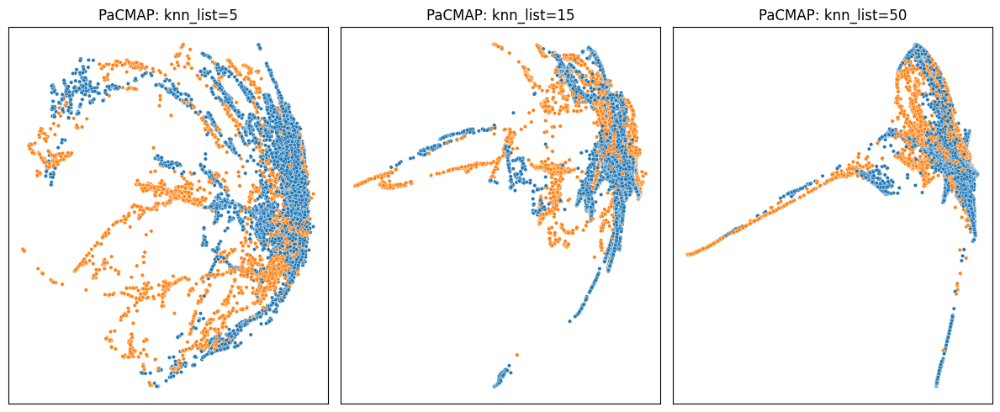

In [45]:
knn_list = [5, 15, 50]

fig, axes = plt.subplots(1, len(knn_list), figsize=(4*len(knn_list), 5))

for i, knn in enumerate(knn_list):
    X_emb = run_phate(X_own_scaled, random_state=42, knn=knn)
    ax = axes[i]
    sns.scatterplot(x=X_emb[:, 0], y=X_emb[:, 1], hue=y_own_labels, palette="tab10", s=10, ax=ax, legend=False)
    ax.set_title(f"PaCMAP: knn_list={knn}")
    ax.set_xticks([]); ax.set_yticks([])

plt.tight_layout()
plt.show()

Обычно структура UMAP меняется плавнее, кластеры остаются узнаваемыми при разумном диапазоне параметров.

*Задача* Аналогично нужно сделать по одной строке графиков для TriMAP, PaCMAP, PHATE с варьированием ключевого параметра (количество соседей или похожий гиперпараметр) и показать, насколько устойчив рисунок.



| Метод  | Скорость на больших данных                   | Локальное разделение              | Глобальная структура                            | Чувствительность к параметрам                         | Комментарий                                        |
| ------ | -------------------------------------------- | --------------------------------- | ----------------------------------------------- | ----------------------------------------------------- | -------------------------------------------------- |
| t‑SNE  | Низкая l                    | Отличное                   | Слабая                                   | Высокая (perplexity, lr, random_state) aicompetence+2 | Хорошо для локальных кластеров, тяжёлый тюнинг     |
| UMAP   | Высокая l                   | Очень хорошее   | Лучшая, чем у t‑SNE           | Ниже, чем у t‑SNE aicompetence+2                      | Хороший баланс локал/глобал, удобен в практике     |
| TriMAP | Средняя                              | Хорошее                   | Сильный упор на глобальную структуру    | Умеренная                                     | Лучше показывает относительное положение кластеров |
| PaCMAP | Средняя                               | Отличное                   | Хорошее                                  | Умеренная                                      | Часто даёт чёткие кластеры и форму многобразия     |
| PHATE  | Средняя/низкая (зависит от размера)   | Хорошее        | Очень хорошее, особенно для траекторий   | Умеренная                          | Сильный метод для непрерывных переходов            |

# Варианты препроцессинга
*Задача* — явно сравнить, как UMAP и t‑SNE реагируют на разные варианты нормировки и отбора признаков.

## Определяем три сценария
Без масштабирования (сырой набор признаков).

StandardScaler (z‑нормировка).

MinMaxScaler + отбор признаков по дисперсии (эмуляция feature selection).

Задание. Проделать все три сценария. Обучить все модели при разных сценария кластеризации. 
Нужно в результате:
1. описать, какие признаки были отброшены и почему это может влиять на качество кластеризации во вложенном пространстве.
1. сравнить вычислительное время и сделать вывод о масштабируемости методов
1. изменить гиперпараметры (perplexity, n_neighbors, min_dist) и исследовать совместное влияние гиперпараметров и препроцессинга на структуру кластеров.


# UMAP

## 1) Без масштабирования

c:\Users\Elisey\AppData\Local\Python\pythoncore-3.14-64\Lib\site-packages\umap\umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(
c:\Users\Elisey\AppData\Local\Python\pythoncore-3.14-64\Lib\site-packages\umap\umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(
c:\Users\Elisey\AppData\Local\Python\pythoncore-3.14-64\Lib\site-packages\umap\umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(
c:\Users\Elisey\AppData\Local\Python\pythoncore-3.14-64\Lib\site-packages\umap\umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(
c:\Users\Elisey\AppData\Local\Python\pythoncore-3.14-64\Lib\site-packages\umap\umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


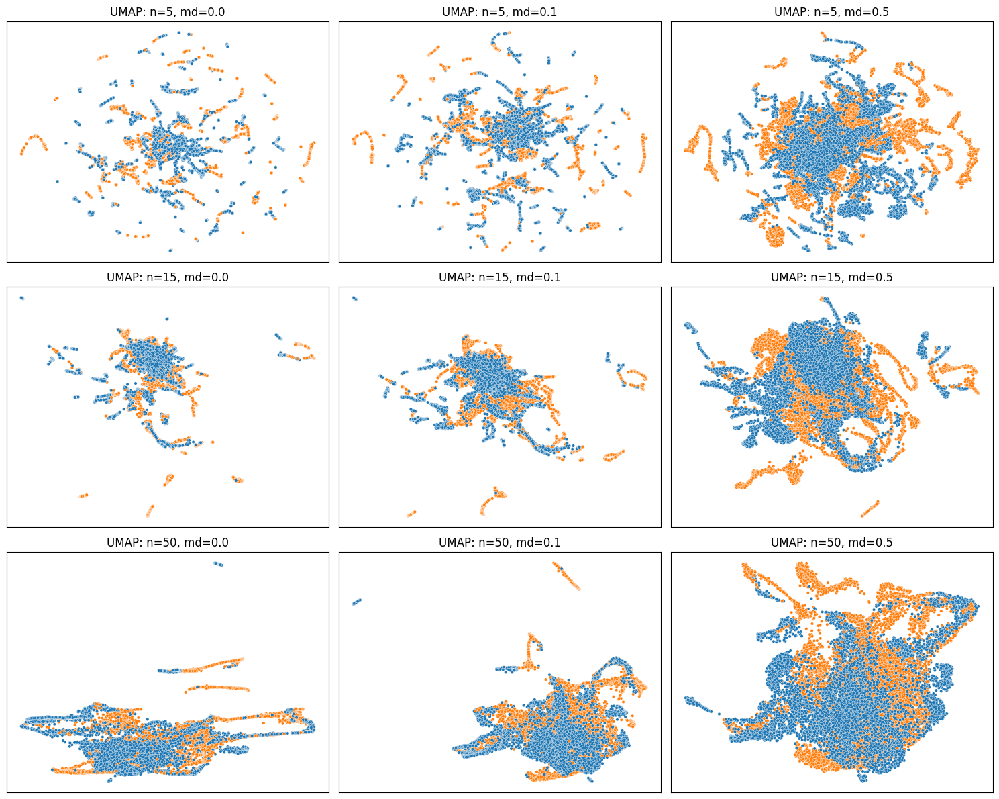

CPU times: total: 3min 52s
Wall time: 3min 59s


In [47]:
%%time
n_neighbors_list = [5, 15, 50]
min_dist_list = [0.0, 0.1, 0.5]

fig, axes = plt.subplots(len(n_neighbors_list), len(min_dist_list), figsize=(5*len(min_dist_list), 4*len(n_neighbors_list)))

for i, n_neighbors in enumerate(n_neighbors_list):
    for j, min_dist in enumerate(min_dist_list):
        X_emb = run_umap(X_own, random_state=42, n_neighbors=n_neighbors, min_dist=min_dist)
        ax = axes[i, j]
        sns.scatterplot(x=X_emb[:, 0], y=X_emb[:, 1], hue=y_own_labels, palette="tab10", s=10, ax=ax, legend=False)
        ax.set_title(f"UMAP: n={n_neighbors}, md={min_dist}")
        ax.set_xticks([]); ax.set_yticks([])

plt.tight_layout()
plt.show()

## 2) StandardScaler

c:\Users\Elisey\AppData\Local\Python\pythoncore-3.14-64\Lib\site-packages\umap\umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(
c:\Users\Elisey\AppData\Local\Python\pythoncore-3.14-64\Lib\site-packages\umap\umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(
c:\Users\Elisey\AppData\Local\Python\pythoncore-3.14-64\Lib\site-packages\umap\umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(
c:\Users\Elisey\AppData\Local\Python\pythoncore-3.14-64\Lib\site-packages\umap\umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(
c:\Users\Elisey\AppData\Local\Python\pythoncore-3.14-64\Lib\site-packages\umap\umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


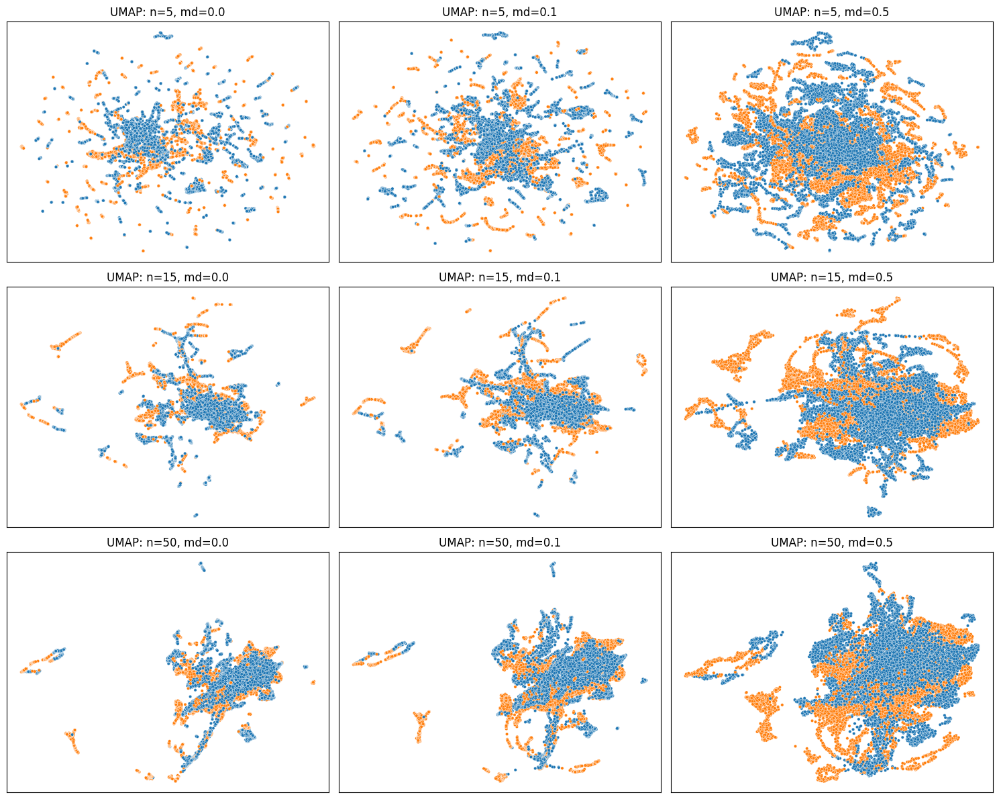

CPU times: total: 1min 18s
Wall time: 1min 20s


In [48]:
%%time
n_neighbors_list = [5, 15, 50]
min_dist_list = [0.0, 0.1, 0.5]

fig, axes = plt.subplots(len(n_neighbors_list), len(min_dist_list), figsize=(5*len(min_dist_list), 4*len(n_neighbors_list)))

for i, n_neighbors in enumerate(n_neighbors_list):
    for j, min_dist in enumerate(min_dist_list):
        X_emb = run_umap(X_own_scaled, random_state=42, n_neighbors=n_neighbors, min_dist=min_dist)
        ax = axes[i, j]
        sns.scatterplot(x=X_emb[:, 0], y=X_emb[:, 1], hue=y_own_labels, palette="tab10", s=10, ax=ax, legend=False)
        ax.set_title(f"UMAP: n={n_neighbors}, md={min_dist}")
        ax.set_xticks([]); ax.set_yticks([])

plt.tight_layout()
plt.show()

## 3) MinMaxScaler + отбор признаков

In [73]:
from sklearn.preprocessing import MinMaxScaler
from sklearn.feature_selection import VarianceThreshold

X_own_min_max_scaled = pd.DataFrame(MinMaxScaler().fit_transform(X_own), columns=feature_cols)
feature_selector = VarianceThreshold()
feature_selector.fit(X_own_min_max_scaled)

,"threshold threshold: float, default=0Features with a training-set variance lower than this threshold willbe removed. The default is to keep all features with non-zero variance,i.e. remove the features that have the same value in all samples.",0.0


In [71]:
threshold = 0.012
selected_features = sorted(zip(feature_selector.variances_, feature_selector.feature_names_in_))
selected_features = [x[1] for x in selected_features if x[0] >= threshold]
selected_features

['P7', 'F3', 'T7', 'AF3', 'F7', 'FC5', 'P8', 'O2', 'O1']

In [74]:
dropped_features = [x for x in feature_cols if x not in selected_features]
dropped_features

['AF4', 'F4', 'F8', 'FC6', 'T8']

In [75]:
X_own_min_max_scaled_selected = X_own_min_max_scaled[selected_features].to_numpy()
X_own_min_max_scaled_selected.shape

(14760, 9)

c:\Users\Elisey\AppData\Local\Python\pythoncore-3.14-64\Lib\site-packages\umap\umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(
c:\Users\Elisey\AppData\Local\Python\pythoncore-3.14-64\Lib\site-packages\umap\umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(
c:\Users\Elisey\AppData\Local\Python\pythoncore-3.14-64\Lib\site-packages\umap\umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(
c:\Users\Elisey\AppData\Local\Python\pythoncore-3.14-64\Lib\site-packages\umap\umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(
c:\Users\Elisey\AppData\Local\Python\pythoncore-3.14-64\Lib\site-packages\umap\umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


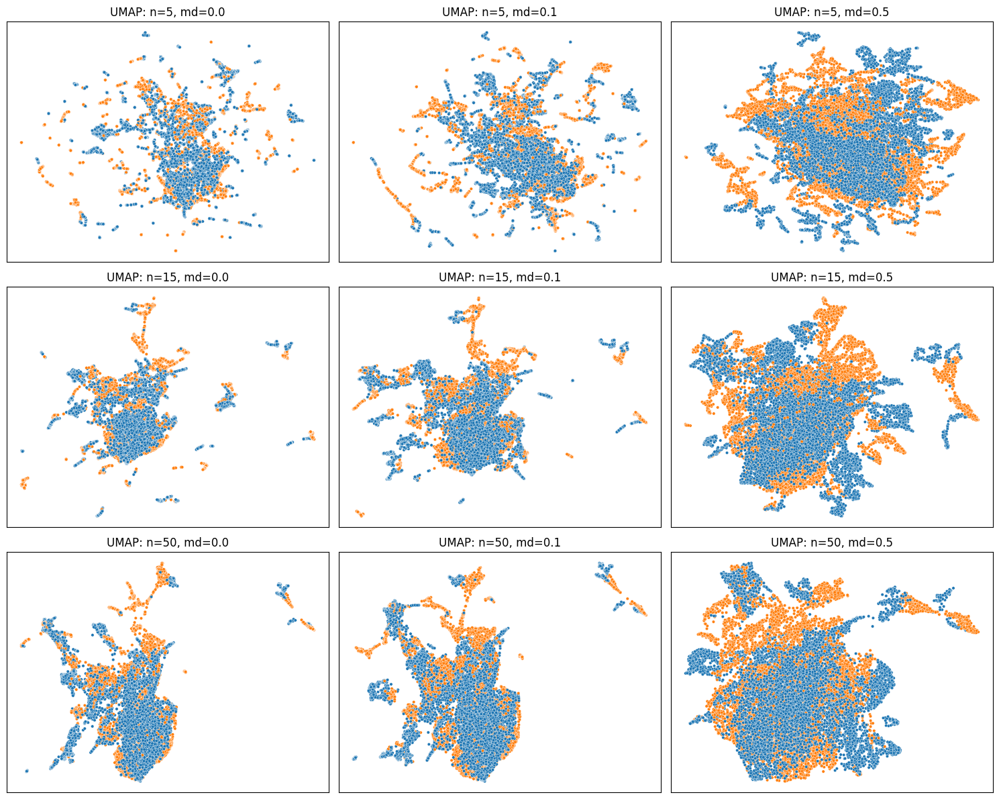

CPU times: total: 1min 14s
Wall time: 1min 15s


In [76]:
%%time
n_neighbors_list = [5, 15, 50]
min_dist_list = [0.0, 0.1, 0.5]

fig, axes = plt.subplots(len(n_neighbors_list), len(min_dist_list), figsize=(5*len(min_dist_list), 4*len(n_neighbors_list)))

for i, n_neighbors in enumerate(n_neighbors_list):
    for j, min_dist in enumerate(min_dist_list):
        X_emb = run_umap(X_own_min_max_scaled_selected, random_state=42, n_neighbors=n_neighbors, min_dist=min_dist)
        ax = axes[i, j]
        sns.scatterplot(x=X_emb[:, 0], y=X_emb[:, 1], hue=y_own_labels, palette="tab10", s=10, ax=ax, legend=False)
        ax.set_title(f"UMAP: n={n_neighbors}, md={min_dist}")
        ax.set_xticks([]); ax.set_yticks([])

plt.tight_layout()
plt.show()

# t-SNE

## 1) Без масштабирования

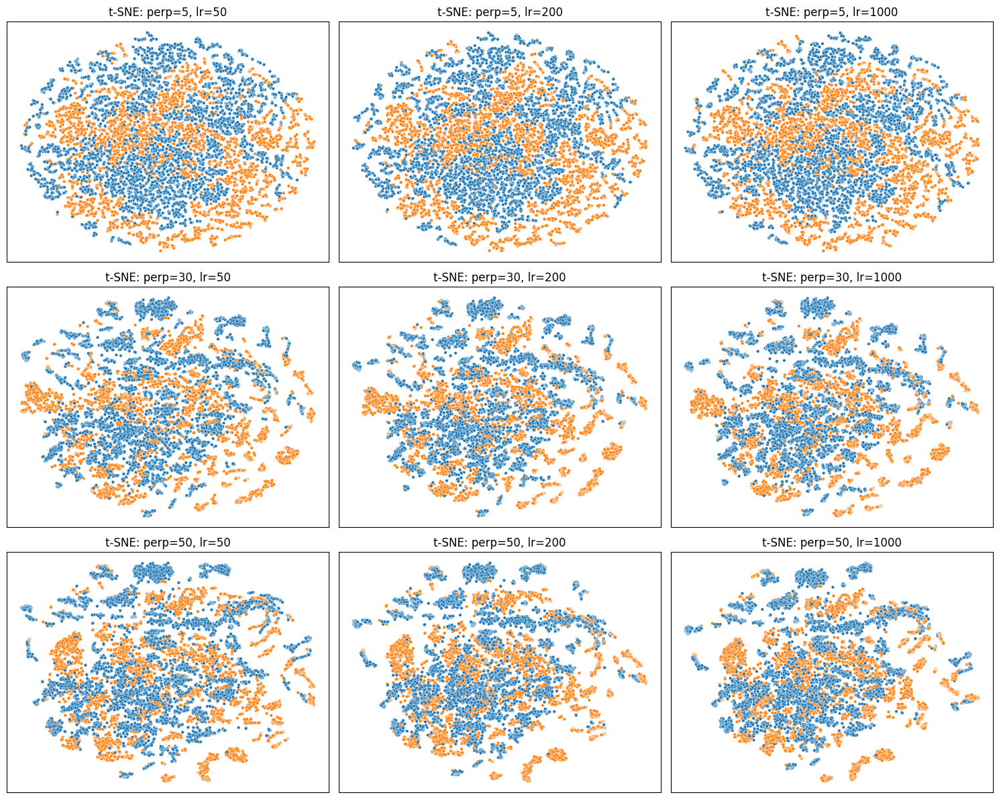

CPU times: total: 33min 39s
Wall time: 5min 42s


In [77]:
%%time
perplexities = [5, 30, 50]
lrs = [50, 200, 1000]

fig, axes = plt.subplots(len(perplexities), len(lrs), figsize=(5*len(lrs), 4*len(perplexities)))

for i, perp in enumerate(perplexities):
    for j, lr in enumerate(lrs):
        X_emb = run_tsne(X_own, random_state=42, perplexity=perp, learning_rate=lr)
        ax = axes[i, j]
        sns.scatterplot(x=X_emb[:, 0], y=X_emb[:, 1], hue=y_own_labels, palette="tab10", s=10, ax=ax, legend=False)
        ax.set_title(f"t-SNE: perp={perp}, lr={lr}")
        ax.set_xticks([]); ax.set_yticks([])

plt.tight_layout()
plt.show()

## 2) StandardScaler

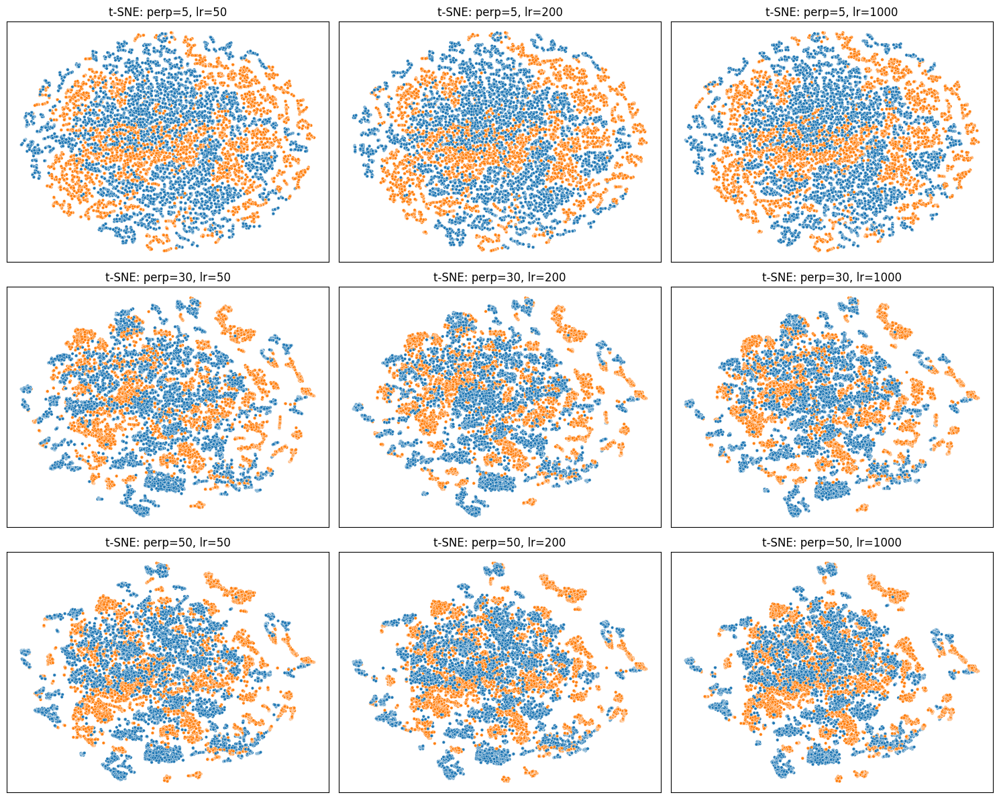

CPU times: total: 30min 20s
Wall time: 6min 23s


In [78]:
%%time
perplexities = [5, 30, 50]
lrs = [50, 200, 1000]

fig, axes = plt.subplots(len(perplexities), len(lrs), figsize=(5*len(lrs), 4*len(perplexities)))

for i, perp in enumerate(perplexities):
    for j, lr in enumerate(lrs):
        X_emb = run_tsne(X_own_scaled, random_state=42, perplexity=perp, learning_rate=lr)
        ax = axes[i, j]
        sns.scatterplot(x=X_emb[:, 0], y=X_emb[:, 1], hue=y_own_labels, palette="tab10", s=10, ax=ax, legend=False)
        ax.set_title(f"t-SNE: perp={perp}, lr={lr}")
        ax.set_xticks([]); ax.set_yticks([])

plt.tight_layout()
plt.show()

## 3) MinMaxScaler + отбор признаков

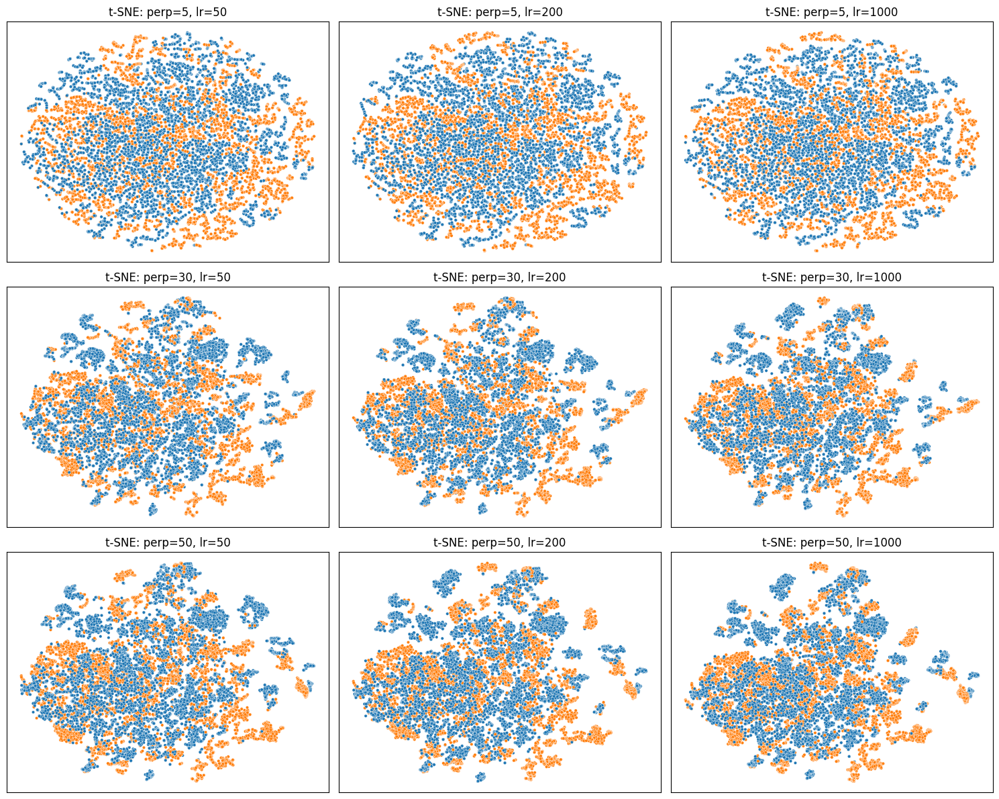

CPU times: total: 37min 15s
Wall time: 4min 22s


In [79]:
%%time
perplexities = [5, 30, 50]
lrs = [50, 200, 1000]

fig, axes = plt.subplots(len(perplexities), len(lrs), figsize=(5*len(lrs), 4*len(perplexities)))

for i, perp in enumerate(perplexities):
    for j, lr in enumerate(lrs):
        X_emb = run_tsne(X_own_min_max_scaled_selected, random_state=42, perplexity=perp, learning_rate=lr)
        ax = axes[i, j]
        sns.scatterplot(x=X_emb[:, 0], y=X_emb[:, 1], hue=y_own_labels, palette="tab10", s=10, ax=ax, legend=False)
        ax.set_title(f"t-SNE: perp={perp}, lr={lr}")
        ax.set_xticks([]); ax.set_yticks([])

plt.tight_layout()
plt.show()

## 1) Были отброшены следующие признаки после отбора признаков по дисперсии: AF4, F4, F8, FC6, T8. Так как датасет содержит измерения различных частей мозга, то конкретно определить что это за признаки возможности нет.
## 2) Для UMAP добавление нормировки к данным заметно сократило время обучения модели. Отбор признаков ещё сократил время обучения. Итоговое сокращение времени составил в 3-4 раза. Однако для t-SNE ситуация другая. Добавление нормировки не уменьшило время обучения, а наоборот, немного увеличило (правда это можно списать на некие фоновые процессы в компьютере, так как разница не очень большая). 
## 3) Для UMAP параметр min_dist при увеличении сильнее группирует точки в одну большую группу, а при уменьшении они разделяются на отдельные "волокна" и точки, и становятся менее центрированными. Параметр n_neighbors регулирует спутанность точек разных классов между собой, то есть при больших значениях этого параметра очень редко встречаются отдельные точки противоположного класса среди большого количество точек другого класса, в то время при маленьких значениях часто появляются заметные вкрапления точек другого класса. Отсутствие нормировки для UMAP приводит к тому, что отдельно взятые кластеры становлятся более бесформенными и вытянутыми, однако на моем датасете это не очень заметно, так как исходные данные уже имеют одинаковый масштаб значений, из-за чего нормировка имеет достаточно слабый эффект.
## Для t-SNE отсутствие нормировки заметно ещё меньше, на первый взгляд вообще нельзя отличить где есть нормировка, а где нет. Также параметр learning_rate добавляет лишь незначительные изменения в кластерах, по большей части просто меняя отдельные кластеры местами. А вот параметр perplexity заметно меняет картину: при маленьких значениях все кластеры представляют собой некий овал, разделённый на разные части (можно сказать "лужи"), в то время при бОльших значениях овал начинает разделяться на независимые части и больше походить на набор некоторых кластеров, а не на один большой.